# Part 2 - Lab 1

## Lab Objectives

- Handling Audio Datasets
- Train and Evaluate a discriminative phone classifier

Dr Hanan Aldarmaki

The Buck eye corpus will be used for this lab. Available at a shared location on HPC. Please make a copy to your home directory     ``` cp /l/users/BuckEyeCorpus/BuckEye /l/users/user.name/```

### 1. Explore Dataset Directory and Import Libraries 

In [31]:
import os
import torch
import librosa
# !pip install -q pydub audiosegment scipy
import audiosegment
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt

from glob import glob
from pathlib import Path
# !pip -q install datasets
from datasets import Dataset
from IPython.display import Audio
# !pip install -q directory-tree
from directory_tree import display_tree

In [8]:
DATA_ROOT = "/home/hawautoyin/Documents/SpeechProcessingLab/BuckEye"
spkrs = glob(DATA_ROOT + "/*/")

In [4]:
display_tree(DATA_ROOT, max_depth=2)

BuckEye/
├── s01/
│   ├── s0101a.log
│   ├── s0101a.phones
│   ├── s0101a.txt
│   ├── s0101a.wav
│   ├── s0101a.words
│   ├── s0101b.log
│   ├── s0101b.phones
│   ├── s0101b.txt
│   ├── s0101b.wav
│   ├── s0101b.words
│   ├── s0102a.log
│   ├── s0102a.phones
│   ├── s0102a.txt
│   ├── s0102a.wav
│   ├── s0102a.words
│   ├── s0102b.log
│   ├── s0102b.phones
│   ├── s0102b.txt
│   ├── s0102b.wav
│   ├── s0102b.words
│   ├── s0103a.log
│   ├── s0103a.phones
│   ├── s0103a.txt
│   ├── s0103a.wav
│   └── s0103a.words
├── s02/
│   ├── s0201a.log
│   ├── s0201a.phones
│   ├── s0201a.txt
│   ├── s0201a.wav
│   ├── s0201a.words
│   ├── s0201b.log
│   ├── s0201b.phones
│   ├── s0201b.txt
│   ├── s0201b.wav
│   ├── s0201b.words
│   ├── s0202a.log
│   ├── s0202a.phones
│   ├── s0202a.txt
│   ├── s0202a.wav
│   ├── s0202a.words
│   ├── s0202b.log
│   ├── s0202b.phones
│   ├── s0202b.txt
│   ├── s0202b.wav
│   ├── s0202b.words
│   ├── s0203a.log
│   ├── s0203a.phones
│   ├── s0203a.txt
│   ├── s0203

### 2. Load and Explore Sample Audio

In [9]:
audio_path = glob(spkrs[0] + "/*.wav")[0]

audio, sr = librosa.load(audio_path, sr=None)

print(f" Audio name: {audio_path.split('/')[-1]} \
        \n Audio Sampling Rate: {sr} \
      \n Audio Shape: {audio.shape} \
          \n Audio Duration: {librosa.get_duration(y=audio,sr=sr)} seconds")

# Play Audio
Audio(data=audio, rate=sr)

 Audio name: s0303b.wav         
 Audio Sampling Rate: 16000       
 Audio Shape: (5203200,)           
 Audio Duration: 325.2 seconds


### 3. Feature Extraction: Mel spectrogram , MFCC

A spectrogram is a visual representation of the spectrum of frequencies of a signal as it varies with time. It is obtained by taking the Fourier transform of a windowed portion of the signal and plotting the magnitude of the resulting spectrum as a function of time. A Mel spectrogram is a spectrogram where the frequency axis is converted to the Mel scale, which better reflects human perception of sound. MFCCs are derived from the Mel spectrogram and capture the temporal dynamics of the audio signal more effectively. MFCCs are obtained by taking the Discrete Cosine Transform (DCT) of the log Mel spectrum, resulting in a compact representation of the spectral envelope of the audio signal.They are widely used as feature vectors in automatic speech recognition (ASR) systems due to their effectiveness in capturing phonetic information while reducing dimensionality.


We'll extract and plot Spectrogram and MFCC of a 2-second segment from an audio using Librosa in this section.

In [10]:
# Get 2 seconds segment from the audio
audio_segment = [x for x in audiosegment.from_file(audio_path).dice(2)][0]
segment = audio_segment.to_numpy_array().astype('float32')

In [11]:
def plot_waveform(waveform, sr, title="Waveform", ax=None):
    # waveform = waveform.numpy()

    num_frames = waveform.shape[0]
    num_channels = 1
    time_axis = torch.arange(0, num_frames) / sr

    if ax is None:
        _, ax = plt.subplots(num_channels, 1)
    ax.plot(time_axis, waveform, linewidth=1)
    ax.grid(True)
    ax.set_xlim([0, time_axis[-1]])
    ax.set_title(title)


def plot_spectrogram(specgram, title=None, ylabel="freq_bin", ax=None):
    if ax is None:
        _, ax = plt.subplots(1, 1)
    if title is not None:
        ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.imshow(librosa.power_to_db(specgram), origin="lower", aspect="auto", interpolation="nearest")

#### Generate and plot spectrogram

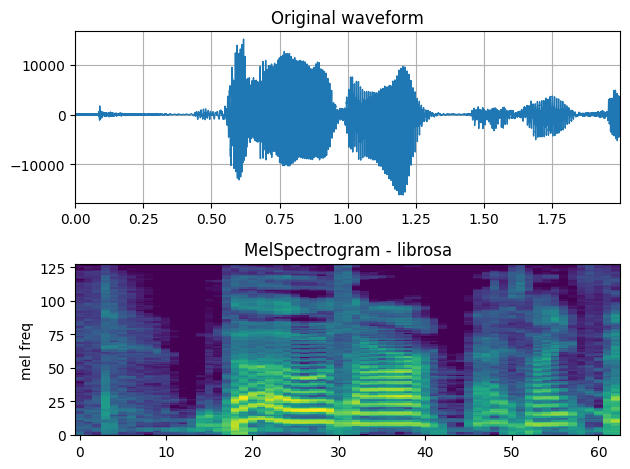

In [12]:
melspec_librosa = librosa.feature.melspectrogram(
    y=segment,
    sr=sr,
    n_fft=1024,
    hop_length=512,
    win_length=None,
    center=True,
    pad_mode="reflect",
    power=2.0,
    n_mels=128,
    norm="slaney",
    htk=True,
)

fig, axs = plt.subplots(2, 1)
plot_waveform(segment, sr, title="Original waveform", ax=axs[0])
plot_spectrogram(melspec_librosa, title="MelSpectrogram - librosa", ylabel="mel freq", ax=axs[1])

plt.tight_layout()
plt.show()

Audio(data=segment, rate=sr)

#### Generate and plot MFCC

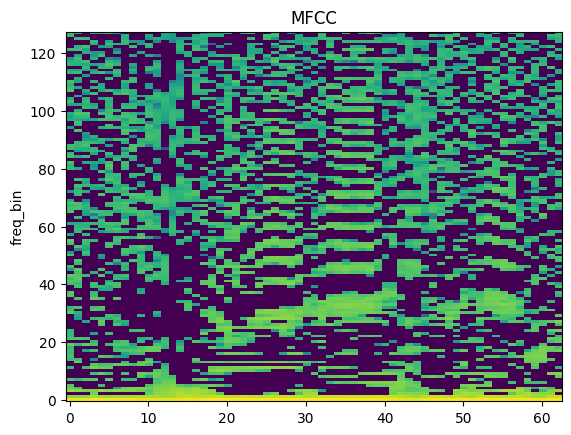

In [13]:
mfcc_librosa = librosa.feature.mfcc(
    S=librosa.core.spectrum.power_to_db(melspec_librosa),
    n_mfcc=128,
    dct_type=2,
    norm="ortho",
)

plot_spectrogram(mfcc_librosa, title="MFCC")

### 4. Data Processing and Feature Extraction

Here we segment each audio per speaker by silence from phones labels and then extract mfcc for each segment and match them to the corresponding frames

In [14]:
#function load the phones and words from the file starting from the line after the "#" line
def load_phones_words(file_path):
    with open(file_path, "r") as file:
        alignments = file.readlines()
        start = alignments.index("#\n")
        alignments = [x.strip() for x in alignments[start+1:]]
    return alignments

#function to split audio on SIL from phones
def load_phone_intervals(word_lines: list, silence_labels=['<SIL>', '<NOISE>', '<IVER>']):
    interval_starts = []
    interval_ends = []
    start_time=0
    end_time=0
    s_start=0
    s_end=0
    in_silence = True
    
    for line in word_lines:
        time_stamp, _, label = line.split()[0:3]
        label=label[:-1]
        if label in silence_labels: 
            if not in_silence:
                in_silence = True
                s_start = end_time
            s_end = float(time_stamp)
            if s_end - s_start > 0.9:
                if end_time > 1 and len(interval_starts) > len(interval_ends):
                    interval_ends.append(end_time)
                    
        else:
            end_time = float(time_stamp)      
            if in_silence:
                if end_time - s_end > 1:
                    in_silence = False
                    if s_end - s_start > 0.9:
                        interval_starts.append(s_end)
            else:
                end_time = float(time_stamp)
                    
    # Check for the last interval
    if not in_silence and len(interval_starts) > len(interval_ends):
        interval_ends.append(end_time)
 
    intervals = list(zip(interval_starts, interval_ends))
    return intervals


def adjust_alignment_timestamps(alignments, start, end):
    adjusted_alignments = []
    for line in alignments:
        # Split the line into components
        components = line.split()
        timestamp = float(components[0])
 
        # Check if the timestamp is within the specified range
        if start < timestamp <= end:
            # Adjust the timestamp to start from 0 and keep the rest of the line unchanged
            adjusted_timestamp = timestamp - start
            adjusted_line = f"{adjusted_timestamp:.6f} " + " ".join(components[1:])
 
            adjusted_alignments.append(adjusted_line)
 
    return adjusted_alignments

Here we segment all samples for a single speaker

In [30]:
SPEAKER_DIR = spkrs[0]
SPEAKER_AUDIOS = glob(SPEAKER_DIR + "/*.wav")
SEGMENTS_DIR = f"{SPEAKER_DIR}/segments"
# Segment all audio files in the speaker directory
for audio_path in SPEAKER_AUDIOS:
    segment_name = Path(audio_path).stem
    audio, sr = librosa.load(audio_path, sr=None)
    phone_path = audio_path.replace(".wav", ".phones")
    word_path = audio_path.replace(".wav", ".words")
    print(f"Reading files for {segment_name}...")
    # Load phone and word alignments
    phone_alignments = load_phones_words(phone_path)
    word_alignments = load_phones_words(word_path)
    intervals = load_phone_intervals(word_alignments)
    print(f"Processing {len(intervals)} segments for {segment_name}")
    !mkdir -p $SEGMENTS_DIR
    for i, (start, end) in enumerate(intervals):
        print("processing file ", i)
        start_sample = int(start * sr)
        end_sample = int(end * sr)
        segment_audio = audio[start_sample:end_sample]
    
        # Resample to 16kHz
        if sr != 16000:
            segment_audio = librosa.resample(segment_audio, orig_sr=sr, target_sr=16000)
            sr = 16000
    
        # Save segment
        sf.write(f'{SEGMENTS_DIR}/{segment_name}_{i}.wav', segment_audio, sr)
    
        # Adjust and save phone and word alignments
        adjusted_phone_lines = adjust_alignment_timestamps(phone_alignments, start, end)
        with open(f'{SEGMENTS_DIR}/{segment_name}_{i}.phones', 'w') as f:
            f.write('\n'.join(adjusted_phone_lines))
    
        adjusted_word_lines = adjust_alignment_timestamps(word_alignments, start, end)
        with open(f'{SEGMENTS_DIR}/{segment_name}_{i}.text', 'w') as f:
            f.write('\n'.join(adjusted_word_lines))
    

Reading files for s0303b...
Processing 8 segments for s0303b
processing file  0
processing file  1
processing file  2
processing file  3
processing file  4
processing file  5
processing file  6
processing file  7
Reading files for s0301a...
Processing 12 segments for s0301a
processing file  0
processing file  1
processing file  2
processing file  3
processing file  4
processing file  5
processing file  6
processing file  7
processing file  8
processing file  9
processing file  10
processing file  11
Reading files for s0302b...
Processing 5 segments for s0302b
processing file  0
processing file  1
processing file  2
processing file  3
processing file  4
Reading files for s0305b...
Processing 7 segments for s0305b
processing file  0
processing file  1
processing file  2
processing file  3
processing file  4
processing file  5
processing file  6
Reading files for s0306a...
Processing 12 segments for s0306a
processing file  0
processing file  1
processing file  2
processing file  3
process

Exercise 1: Generate segments for all samples for each speaker

In [ ]:
#Generate segments for all samples for each speaker
...

Now, we extract MFCC features of each segmented utterance and phones corresponding to each frame of the mfcc. The goal of this section is a dataset of MFCC features with a phone label for each frame ```(mffc_feature, phone)```

Exercise 2: Complete the functions below to load phone alignments and merge with mfcc frames. Note mfcc for full audio should be extracted first.

In [32]:
def extract_mfcc_features(audio_file, sr=16000, n_mfcc=13, frame_length=25, hop_length=10):
    audio, _ = librosa.load(audio_file, sr=sr)
    frame_length_samples = int(sr * frame_length / 1000)
    hop_length_samples = int(sr * hop_length / 1000)
 
    # Extract MFCC features using librosa
    mfcc = ...
    return mfcc.T  # Transpose to have time along the rows
 
def align_mfcc_with_phones(mfcc_features, phone_file, sr=16000, hop_length=10):
    hop_length_seconds = hop_length / 1000
 
    # Load phone alignments, segmented phones start from first line of .phones 
    phone_alignments = [] #[(start_time, end_time, phone) for each phone in recording from .phones file]
    ...
 
    # Align MFCC features with phone labels
    labeled_mfcc = [] # [(mfcc, label) for each mfcc frame] 
    ...
    return labeled_mfcc

Using defined function, we extract features for a single speaker

In [33]:
SPEAKER_DIR = spkrs[0]
SEGMENTS_DIR = f"{SPEAKER_DIR}/segments"
segmented_audios = sorted(glob(SEGMENTS_DIR + "/*.wav"))
segmented_phones =  sorted(glob(SEGMENTS_DIR + "/*.phones"))
assert len(segmented_audios) == len(segmented_phones), "existing audios don't match phones"
num_segments = len(segmented_audios) # Number of segments

data = []
for i in range(num_segments):
    mfcc_features = extract_mfcc_features(segmented_audios[i])
    labeled_mfcc = align_mfcc_with_phones(mfcc_features, segmented_phones[i])
    data.append(labeled_mfcc)
   
print(data[0][10])
#flatten the above ? Or use seqments to extract more feature vectors (i.e. surrounding?)

(array([-308.98648  ,  127.70773  ,  -69.28314  ,   -9.428489 ,
        -13.236113 ,  -18.455406 ,  -22.92355  ,  -11.504625 ,
         -1.0510433,   18.134445 ,  -12.067404 ,   -7.140284 ,
        -32.99801  ], dtype=float32), 'ay')


Here we make a ssmple dataset from features of 1 of the segments. 

In [47]:
def make_dataset(data=data[0]):
    for _, item in enumerate(data):
        yield {"mfcc_feature": item[0], "phone": item[1]}
        
dataset = Dataset.from_generator(make_dataset)

Generating train split: 4516 examples [00:00, 145539.10 examples/s]


In [52]:
dataset

Dataset({
    features: ['mfcc_feature', 'phone'],
    num_rows: 4516
})

Exercise 3: Make a dataset for all segments from all speakers.

In [ ]:
# Extract features for all speakers
...

In [53]:
# Generate Dataset using data for all speakers
...

In [54]:
# Make train, test split
dataset.train_test_split(seed=1234)

DatasetDict({
    train: Dataset({
        features: ['mfcc_feature', 'phone'],
        num_rows: 3387
    })
    test: Dataset({
        features: ['mfcc_feature', 'phone'],
        num_rows: 1129
    })
})

### Exercise 4: Train a classifier

You can either build a simple classifier with individual MFCC frames, or take a window of context, or build an RNN

Evaluation should be in frame error rate, in addition to qualitative evaluation by looking at specific utterances and their predicted labels

In [55]:
# training code


# inference code



In [ ]:
# evaluation

Exercise 5: Build a comparative model, following same approach as above (either simple or window of context)

In [ ]:
# training code


# inference code


# evaluation

In [ ]:
# compare models